In [1]:
from massimal.hyspec_io import load_envi_image
from massimal.image_render import percentile_stretch, absolute_stretch
from massimal.preprocess import inpaint_masked
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np 
from sklearn.decomposition import PCA
from tqdm import tqdm

In [2]:
# Paths
image_dir = Path(r"M:\PosterGeoHab2024\vega_sola\hyperspec\extract_spectra_images\hyperspec_downsamp_sgf")
example_image = image_dir / 'Vega_SolaNW_Sound3a_Pika_L_1-Crop Wavelengths-Savitzky-Golay Smoothing.bip.hdr'
image_paths = sorted(image_dir.glob('*.hdr'))


In [47]:
# Parameters
# rgb_stretch_limits = np.array([[0.003, 0.011, 0.008],   # Original RGB indices
#                                [0.025, 0.090, 0.048]])
# rgb_stretch_limits = np.array([[0.0035, 0.0110, 0.0074],   # Modified RGB indices
#                                [0.0297, 0.0918, 0.0585]])
# rgb_stretch_limits = np.array([[0.0035, 0.0110, 0.0074],   # Modified RGB indices, less red
#                                [0.0400, 0.0918, 0.0585]])
# rgb_stretch_limits = np.array([[0.0035, 0.0110, 0.0074],   # Modified RGB indices, less red, upper green limit increased
#                                [0.0400, 0.1200, 0.0585]])
# rgb_stretch_limits = np.array([[0.0035, 0.0110, 0.0074],   # Modified RGB indices, less red, upper green limit increased, upper blue limit decreased
#                                [0.0400, 0.1200, 0.05]])
rgb_stretch_limits = np.array([[0.0035, 0.0110, 0.0074],   # Modified RGB indices, less red, upper green limit increased, upper blue limit decreased (good)
                               [0.0400, 0.0900, 0.045]])

rgb_mod_wl = [640,570,500]

In [12]:
image,wl,rgb_ind_orig,metadata = load_envi_image(example_image)

In [5]:
rgb_ind = tuple([np.argmin(np.abs(wl-rgb_wl)) for rgb_wl in rgb_mod_wl])
print(f'Original RGB indices: {rgb_ind_orig}')
print(f'Modified RGB indices: {rgb_ind}')


Original RGB indices: (121, 78, 34)
Modified RGB indices: (121, 88, 54)


In [13]:
image_rgb = image[:,:,rgb_ind]
mask = np.all(image_rgb==0,axis=2)
image_rgb = inpaint_masked(image_rgb,mask)

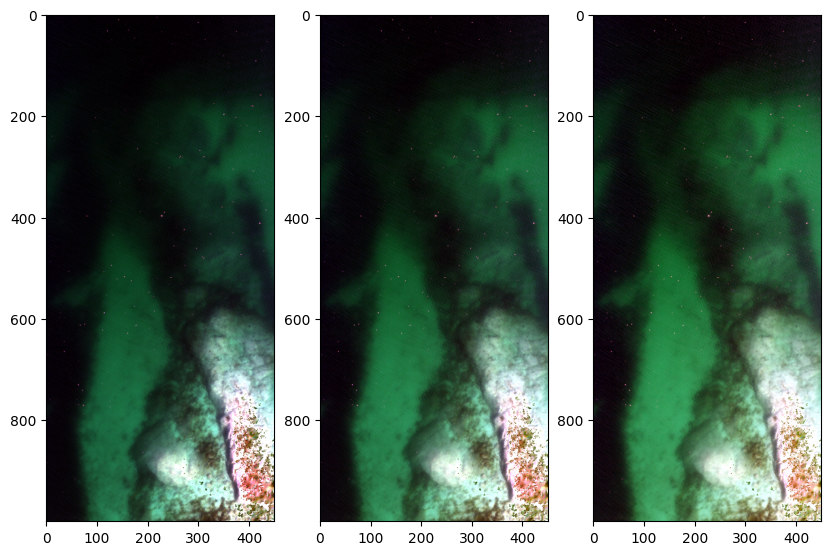

In [14]:
fig,ax = plt.subplots(ncols=3,figsize=(10,7))
ax[0].imshow(percentile_stretch(image_rgb))
ax[1].imshow(percentile_stretch(image_rgb**(1/2)))
ax[2].imshow(percentile_stretch(np.log10(image_rgb)))
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


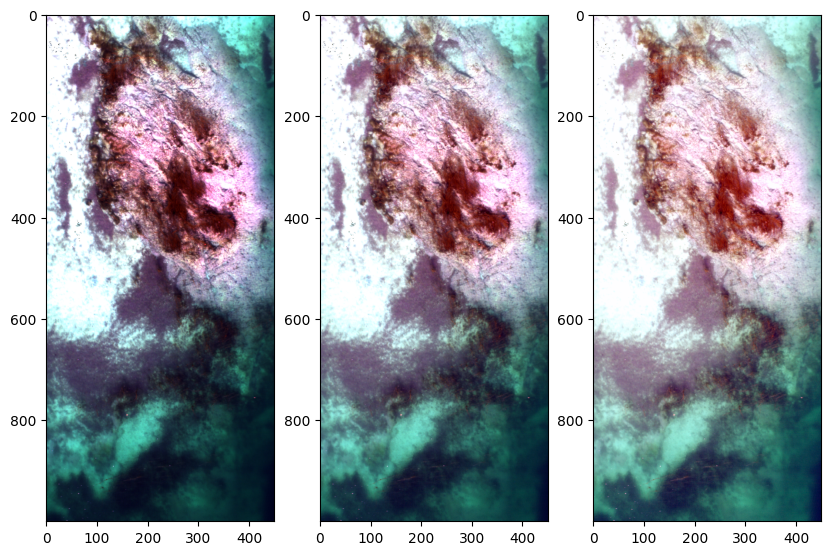

In [45]:
fig,ax = plt.subplots(ncols=3,figsize=(10,7))
ax[0].imshow(absolute_stretch(image_rgb,limits=rgb_stretch_limits.T))
ax[1].imshow(absolute_stretch(image_rgb**(0.5),limits=(rgb_stretch_limits.T)**(0.5)))
ax[2].imshow(absolute_stretch(np.log10(image_rgb),limits=np.log10(rgb_stretch_limits.T)))
plt.show()

In [9]:
rgb_images = []

for image_path in tqdm(image_paths):
    image,wl,rgb_ind,metadata = load_envi_image(image_path)
    image_rgb = image[:,:,rgb_ind]
    mask = np.all(image_rgb==0,axis=2)
    image_rgb = inpaint_masked(image_rgb,mask)
    rgb_images.append(image_rgb)


  0%|          | 0/17 [00:00<?, ?it/s]

100%|██████████| 17/17 [00:40<00:00,  2.36s/it]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


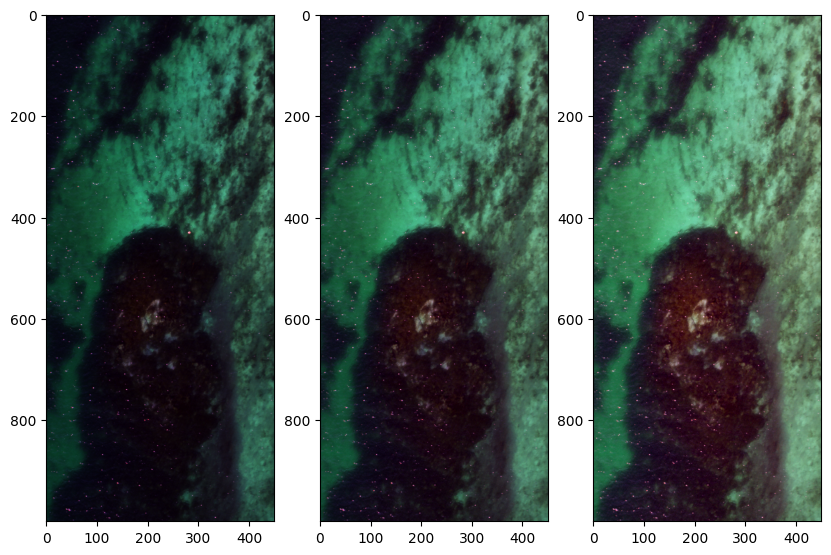

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


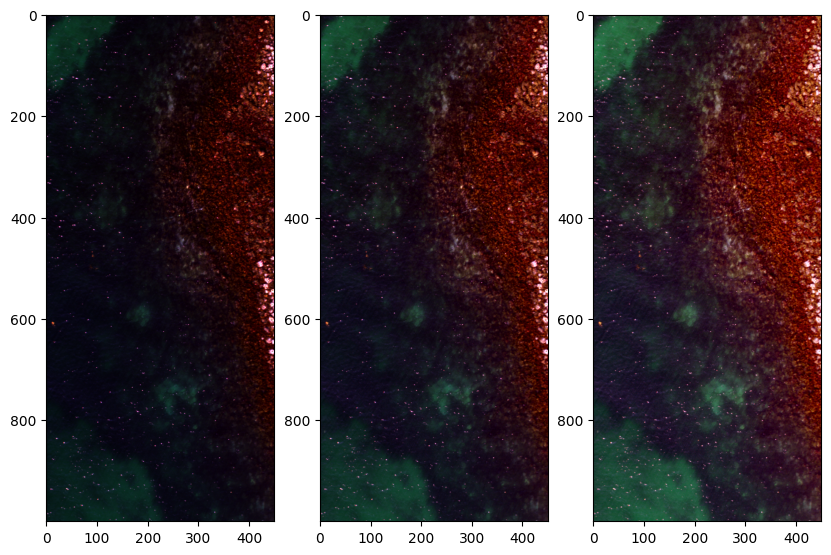

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


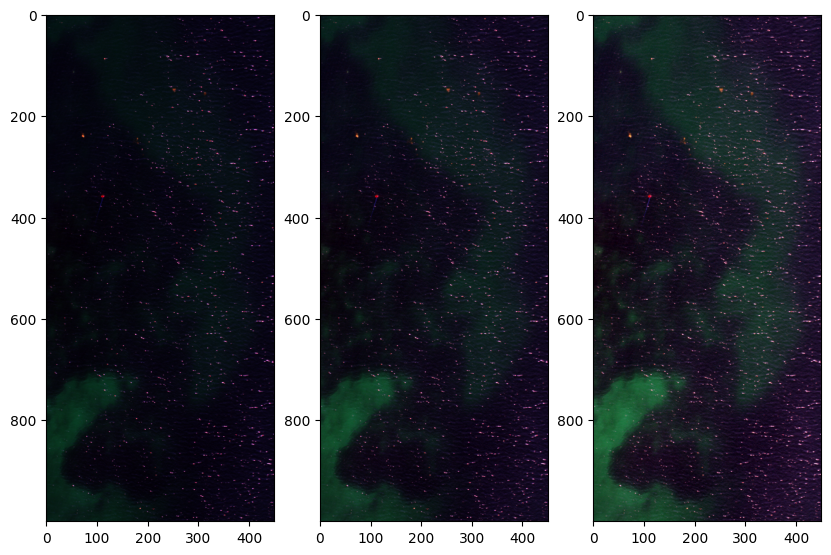

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


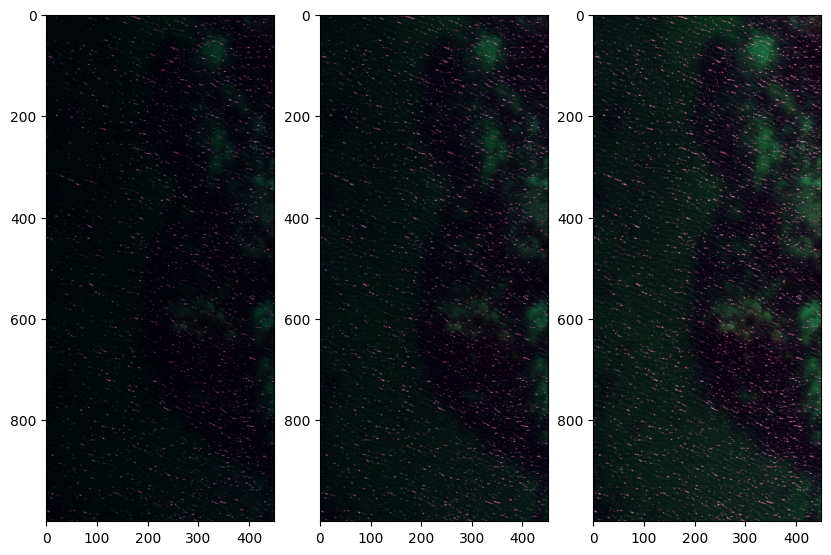

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


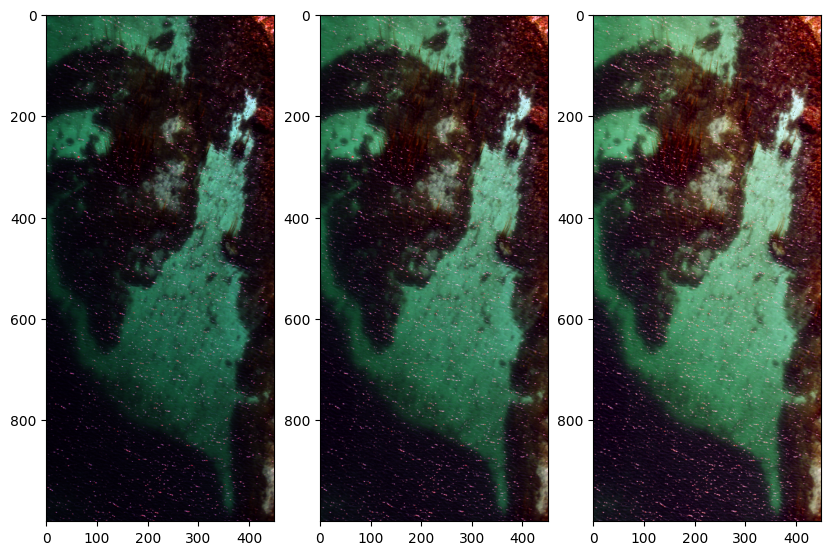

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\mha114\AppData\Local\Temp\ipykernel_12188\1294555081.py:5: RuntimeWarning: divide by zero encountered in log10
  ax[2].imshow(absolute_stretch(np.log10(image_rgb),limits=np.log10(rgb_stretch_limits.T)))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


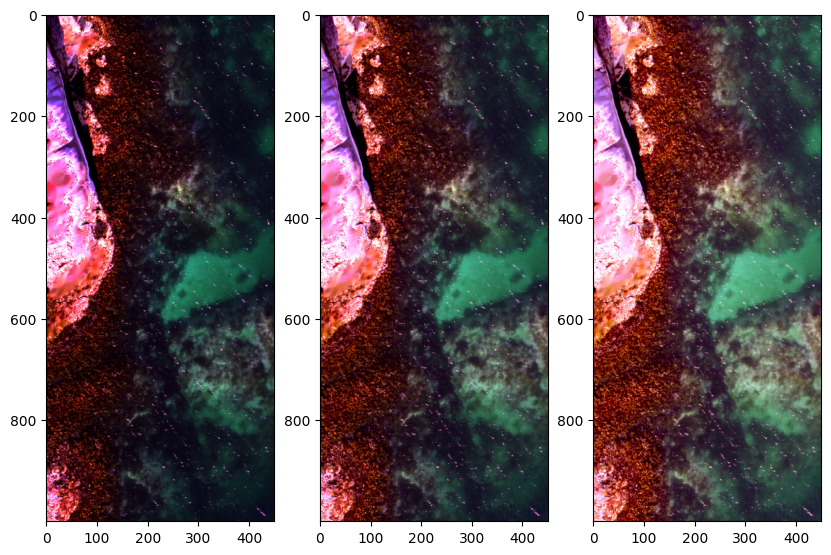

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


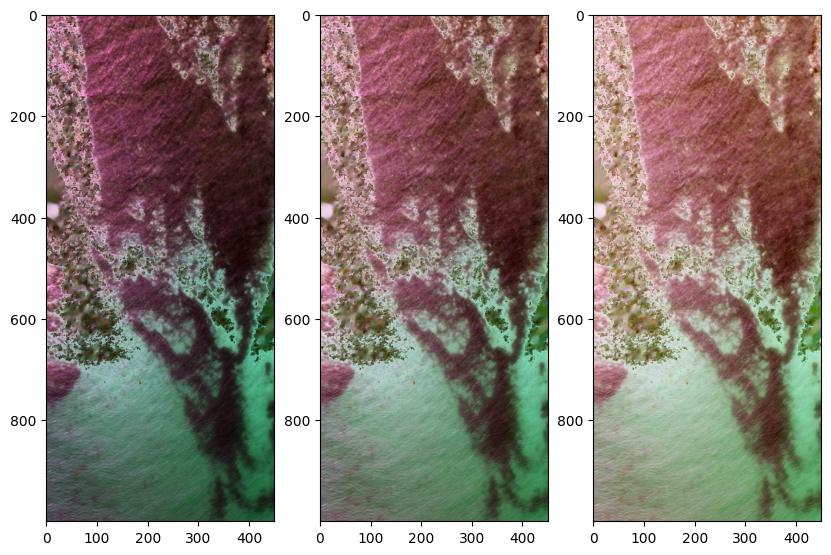

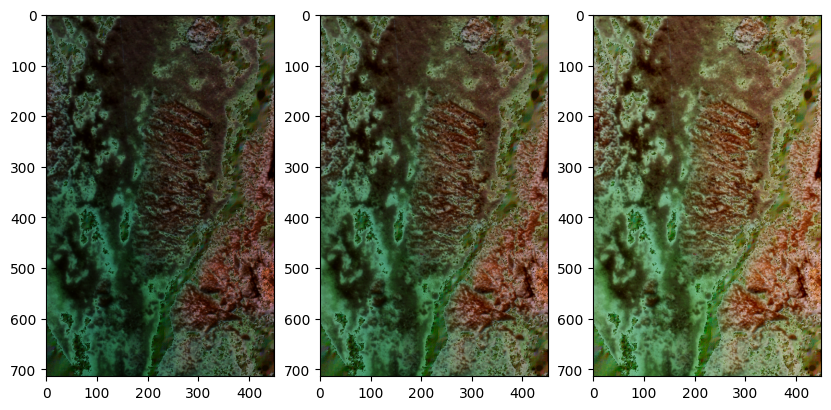

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


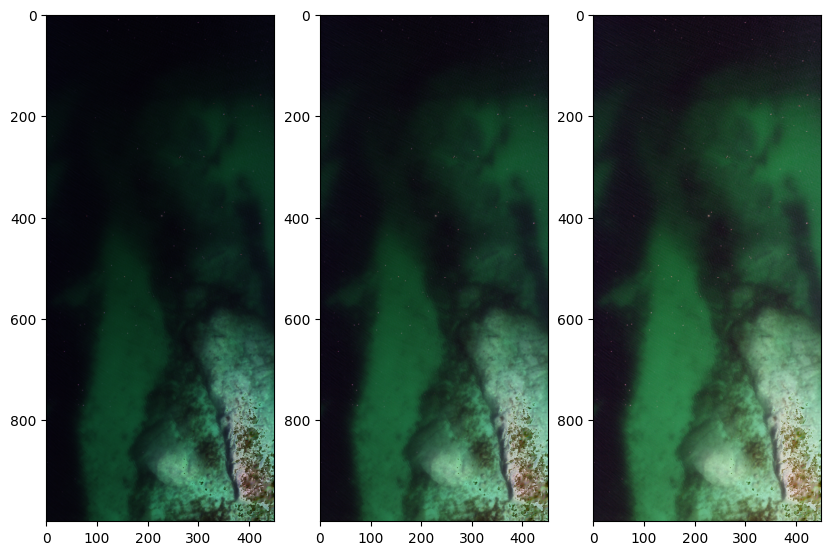

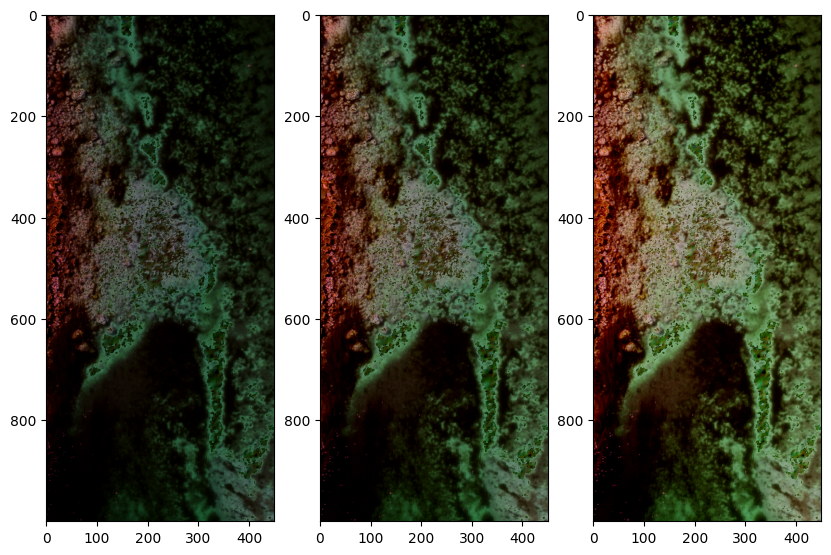

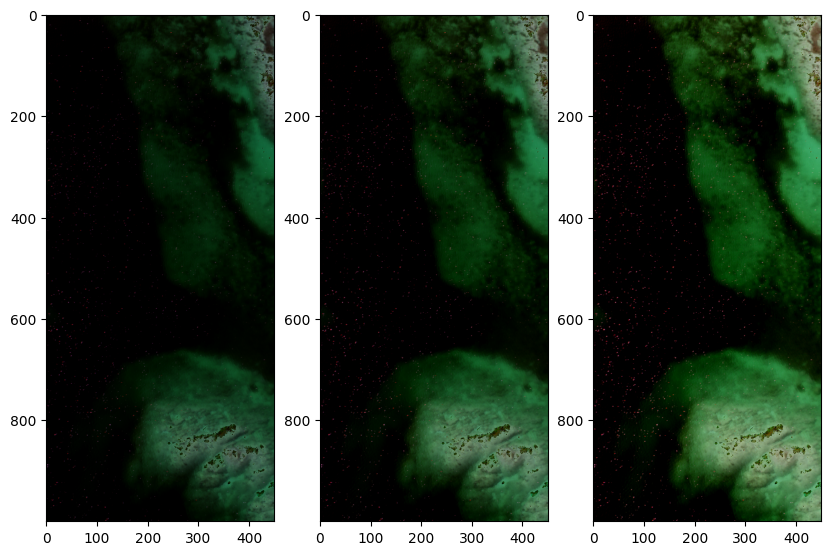

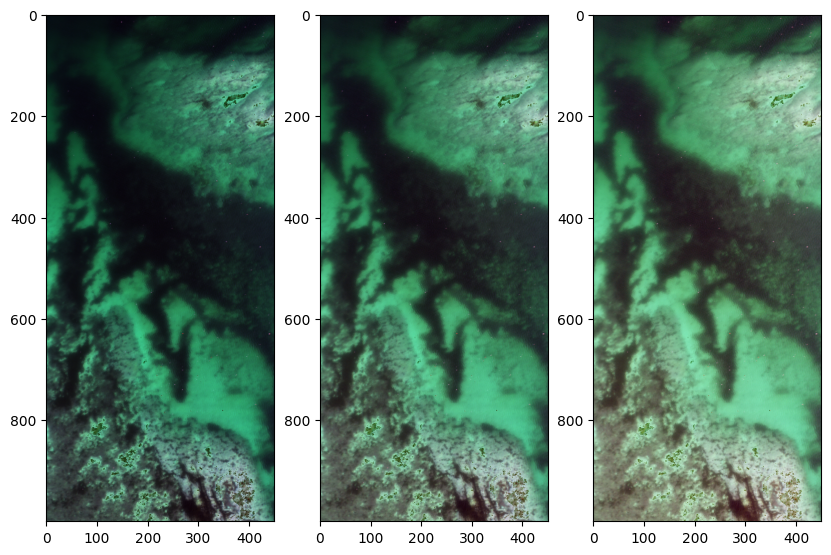

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


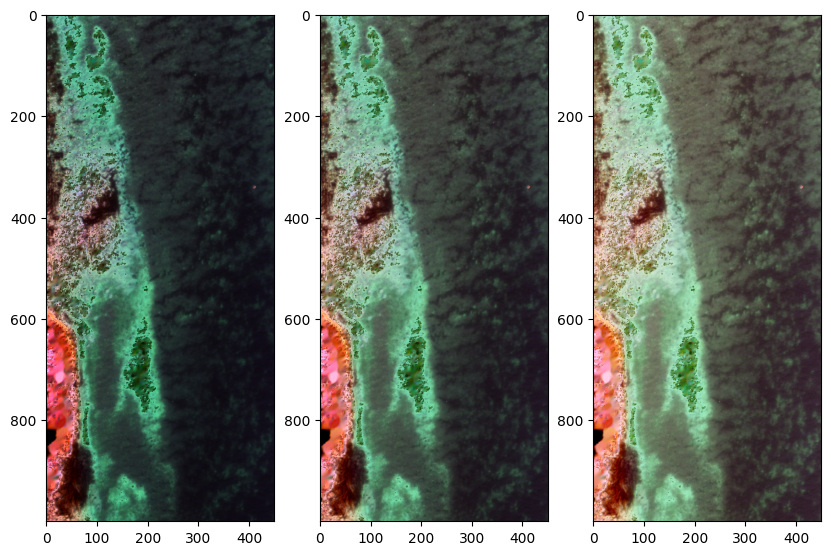

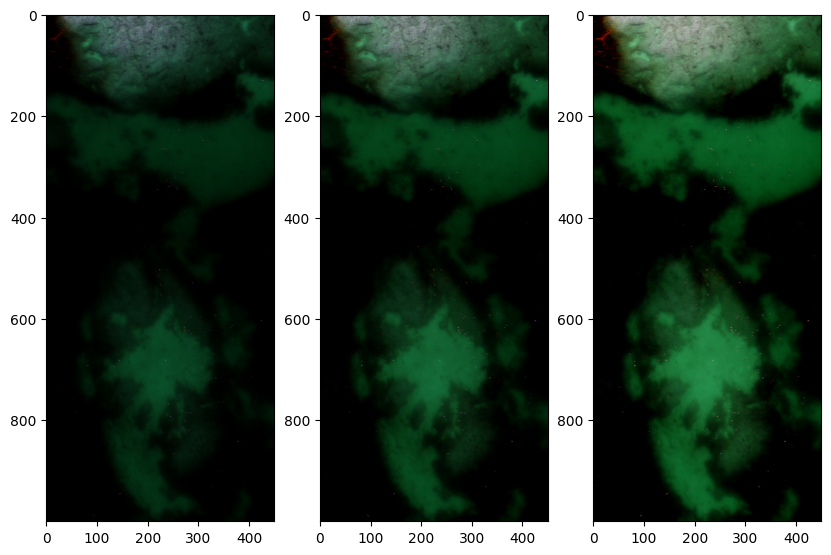

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


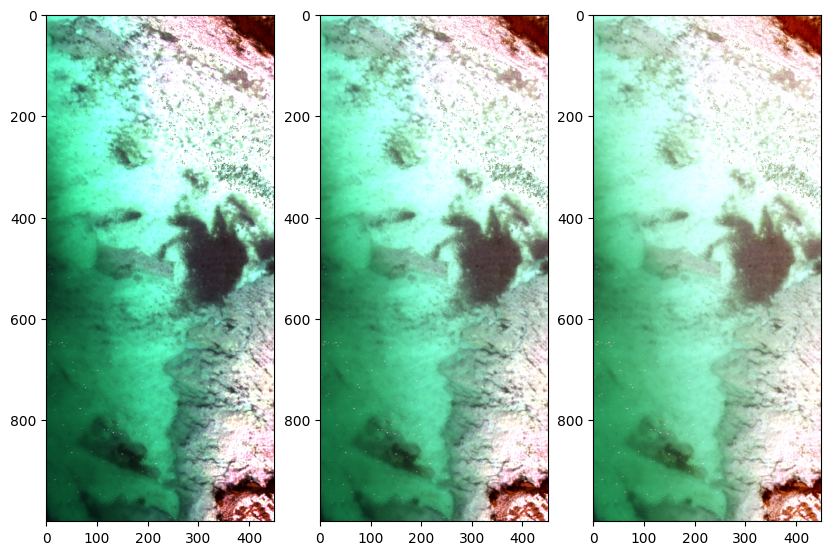

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


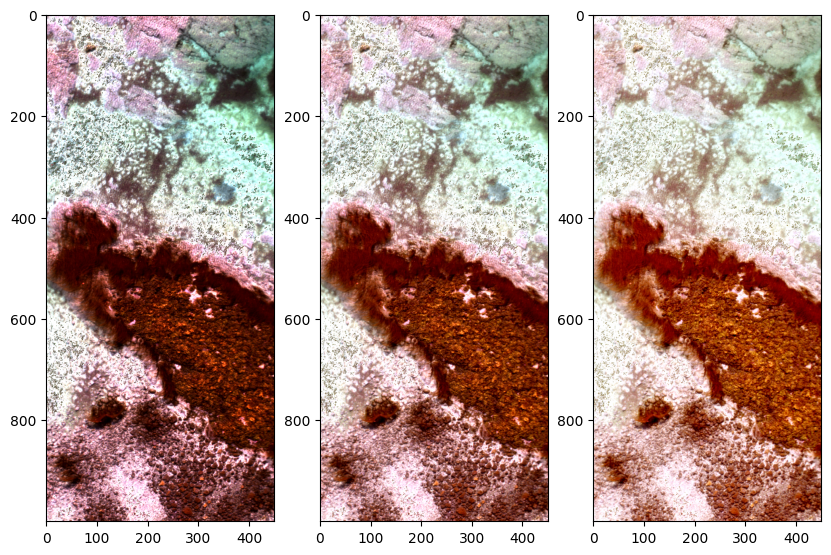

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


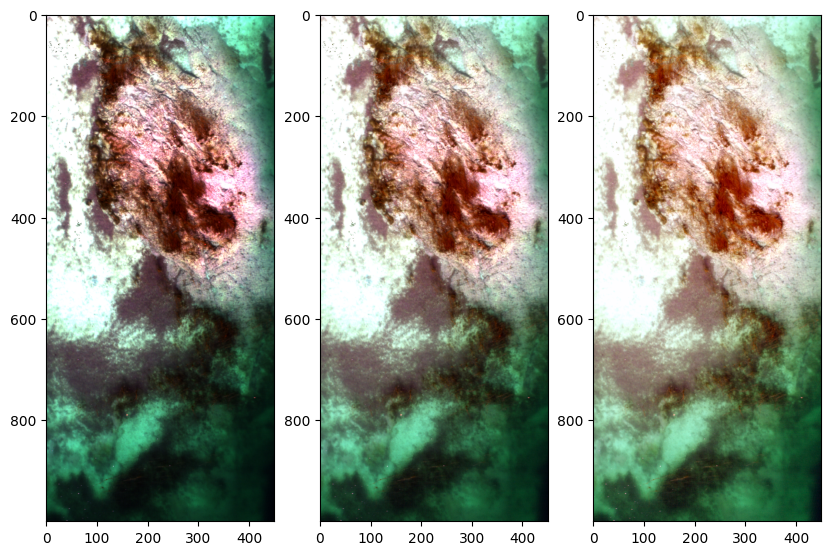

In [49]:
for image_rgb in rgb_images:
    fig,ax = plt.subplots(ncols=3,figsize=(10,7))
    ax[0].imshow(absolute_stretch(image_rgb,limits=rgb_stretch_limits.T))
    ax[1].imshow(absolute_stretch(image_rgb**(0.5),limits=(rgb_stretch_limits.T)**(0.5)))
    ax[2].imshow(absolute_stretch(np.log10(image_rgb),limits=np.log10(rgb_stretch_limits.T)))
    plt.show()